In [39]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.utils import resample, shuffle
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.decomposition import PCA
import joblib

## Data Understanding

In [4]:
df = pd.read_csv('../data/train.csv')
df.head()

C:\Users\ghifarullah19\AppData\Local\Temp\ipykernel_10592\2938383847.py:1: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('data/train.csv')


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


- Banyak data yang memiliki data yang tidak sesuai dengan format yang diinginkan

In [5]:
df.isnull().sum()

ID                              0
Customer_ID                     0
Month                           0
Name                         9985
Age                             0
SSN                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit            0
Num_Credit_Inquiries         1965
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour               0
Monthly_Balance              1200
Credit_Score                    0
dtype: int64

- Banyak data yang memiliki missing value

### Pembersihan Data Numerik

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

- Ada beberapa kolom yang tidak memiliki tipe data yang sesuai

In [7]:
df.describe(include='all')

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
count,100000,100000,100000,90015,100000,100000,100000,100000,84998.000000,100000.000000,...,100000,100000,100000.000000,90970,100000,100000.000000,95521,100000,98800,100000
unique,100000,12500,8,10139,1788,12501,16,18940,NaN,NaN,...,4,13178,NaN,404,3,NaN,91049,7,98792,3
top,0x1602,CUS_0xd40,January,Langep,38,#F%$D@*&8,_______,36585.12,NaN,NaN,...,Standard,1360.45,NaN,15 Years and 11 Months,Yes,NaN,__10000__,Low_spent_Small_value_payments,__-333333333333333333333333333__,Standard
freq,1,8,12500,44,2833,5572,7062,16,NaN,NaN,...,36479,24,NaN,446,52326,NaN,4305,25513,9,53174
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4194.170850,17.091280,...,NaN,NaN,32.285173,NaN,NaN,1403.118217,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3183.686167,117.404834,...,NaN,NaN,5.116875,NaN,NaN,8306.041270,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,303.645417,-1.000000,...,NaN,NaN,20.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1625.568229,3.000000,...,NaN,NaN,28.052567,NaN,NaN,30.306660,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3093.745000,6.000000,...,NaN,NaN,32.305784,NaN,NaN,69.249473,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5957.448333,7.000000,...,NaN,NaN,36.496663,NaN,NaN,161.224249,NaN,NaN,NaN,NaN


- Jika diperhatikan, ada nilai bermasalah seperti '\__10000__\' dan '\__-333333333333333333333333333__\'. Nilai inilah yang perlu kita bersihkan untuk mengubah tipe data dari fitur tersebut.

In [8]:
def return_null(val):
    if isinstance(val, str) and '__' in val:
        return np.NaN
    elif isinstance(val, str) and '_' in val:
        return np.NaN
    else:
        return val

In [9]:
new_df = df.copy()
invalid_numerical_columns = [
    'Age',
    'Annual_Income',
    'Monthly_Inhand_Salary',
    'Num_of_Loan',
    'Num_of_Delayed_Payment',
    'Changed_Credit_Limit',
    'Outstanding_Debt',
    'Amount_invested_monthly',
    'Monthly_Balance'
]

for col in invalid_numerical_columns:
    new_df[col] = new_df[col].apply(return_null)
    new_df[col] = new_df[col].astype('float')

new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       95061 non-null   float64
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             93020 non-null   float64
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               95215 non-null   float64
 13  Type_of_Loan              88592 non-null   ob

- Semua fitur telah diperbaiki kecuali fitur 'credit_history_age'. Untuk memperbaikinya, kita memerlukan helper function.

In [10]:
import re

def cal_history_age(val):
    try:
        year, month = 0, 0
        if re.search('year', val, re.IGNORECASE):
            year = int(re.findall('\d+', val)[0])
        if re.search('month', val, re.IGNORECASE):
            month = int(re.findall('\d+', val)[1])
        return year * 12 + month
    except:
        return np.NaN

- Sederhananya, helper function tersebut akan mengambil komponen tahun dan bulan dair data credit_history_age. Proses ini dilakukan menggunakan regex. Helper function ini mengembalikan total bulan dari riwayat kredit dan NaN jika gagal.

In [11]:
new_df['Credit_History_Age'] = new_df['Credit_History_Age'].apply(cal_history_age)
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       95061 non-null   float64
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             93020 non-null   float64
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               95215 non-null   float64
 13  Type_of_Loan              88592 non-null   ob

- Selanjutnya memilih fitur yang relevan, kita mengetahui bahwa Annual_Income dan Monthly_Inhand_Salary merepresentasikan hal yang sama yaitu pendapatan yang diperoleh setiap pelanggan. Oleh karena itu, kita hanya memerlukan salah satu fitur tersebut.

In [12]:
new_df.drop(['ID', 'Name', 'SSN', 'Annual_Income'], axis=1, inplace=True)

- Selanjutnya kita akan membersihkan data numerik.

In [13]:
numerical_columns = [
    'Age',
    'Monthly_Inhand_Salary',
    'Num_Bank_Accounts',
    'Num_Credit_Card',
    'Interest_Rate',
    'Num_of_Loan',
    'Delay_from_due_date',
    'Num_of_Delayed_Payment',
    'Changed_Credit_Limit',
    'Num_Credit_Inquiries',
    'Outstanding_Debt',
    'Credit_Utilization_Ratio',
    'Total_EMI_per_month',
    'Amount_invested_monthly',
    'Monthly_Balance',
    'Credit_History_Age'
]

new_df[numerical_columns].describe()

,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_History_Age
count,95061.000000,84998.000000,100000.000000,100000.00000,100000.000000,95215.000000,100000.000000,90254.000000,97909.000000,98035.000000,98991.000000,100000.000000,100000.000000,91216.000000,98791.000000,90970.000000
mean,110.934505,4194.170850,17.091280,22.47443,72.466040,2.780339,21.068780,31.033051,10.389025,27.754251,1426.503700,32.285173,1403.118217,195.539456,402.551258,221.195405
std,689.407864,3183.686167,117.404834,129.05741,466.422621,62.500940,14.860104,226.955758,6.789496,193.177339,1155.045753,5.116875,8306.041270,199.564527,213.925499,99.741364
min,-500.000000,303.645417,-1.000000,0.00000,1.000000,-100.000000,-5.000000,-3.000000,-6.490000,0.000000,0.230000,20.000000,0.000000,0.000000,0.007760,1.000000
25%,24.000000,1625.568229,3.000000,4.00000,8.000000,1.000000,10.000000,9.000000,5.320000,3.000000,566.080000,28.052567,30.306660,72.236692,270.106630,144.000000
50%,33.000000,3093.745000,6.000000,5.00000,13.000000,3.000000,18.000000,14.000000,9.400000,6.000000,1166.370000,32.305784,69.249473,128.954538,336.731225,219.000000
75%,42.000000,5957.448333,7.000000,7.00000,20.000000,5.000000,28.000000,18.000000,14.870000,9.000000,1948.200000,36.496663,161.224249,236.815814,470.262938,302.000000
max,8698.000000,15204.633333,1798.000000,1499.00000,5797.000000,1496.000000,67.000000,4397.000000,36.970000,2597.000000,4998.070000,50.000000,82331.000000,1977.326102,1602.040519,404.000000


- Nah, berdasarkan hasil tersebut terlihat beberapa nilai yang tidak biasa seperti umur -500 tahun, jumlah akun bank sebanyak 1798, dll. Nilai tersebut perlu divalidasi terlebih dahulu.

In [14]:
def check_invalid_values(df, invalid_value, column):
    df = df.copy()
    customer_id = df[(df[column] == invalid_value)].groupby(by='Customer_ID', as_index=False)['Num_Bank_Accounts'].mean()
    print(df[df.Customer_ID.isin(customer_id.Customer_ID)])

check_invalid_values(new_df, -500, 'Age')

      Customer_ID     Month    Age Occupation  Monthly_Inhand_Salary  \
0       CUS_0xd40   January   23.0  Scientist            1824.843333   
1       CUS_0xd40  February   23.0  Scientist                    NaN   
2       CUS_0xd40     March -500.0  Scientist                    NaN   
3       CUS_0xd40     April   23.0  Scientist                    NaN   
4       CUS_0xd40       May   23.0  Scientist            1824.843333   
...           ...       ...    ...        ...                    ...   
99963  CUS_0x372c     April -500.0     Lawyer                    NaN   
99964  CUS_0x372c       May   18.0     Lawyer            3468.315833   
99965  CUS_0x372c      June   19.0     Lawyer            3468.315833   
99966  CUS_0x372c      July   19.0     Lawyer            3468.315833   
99967  CUS_0x372c    August   19.0     Lawyer            3468.315833   

       Num_Bank_Accounts  Num_Credit_Card  Interest_Rate  Num_of_Loan  \
0                      3                4              3      

- Berikut adalah beberapa kolom yang perlu diperbaiki:
    - Pada kolom Age, semua nilai yang lebih kecil dari 0 atau lebih besar dari 90 merupakan invalid value. 
    - Pada kolom Num_Bank_Accounts, semua nilai yang lebih kecil dari 0 atau lebih besar dari 15 merupakan invalid value.
    - Pada kolom Num_Credit_Card, semua nilai yang lebih kecil dari 0 atau lebih besar dari 15 merupakan invalid value.
    - Pada kolom Interest_Rate, semua nilai yang lebih besar dari 50 merupakan invalid value.
    - Pada kolom Num_of_Loan, semua nilai yang lebih kecil dari 0 atau lebih besar dari 10 merupakan invalid value.
    - Pada kolom Delay_from_due_date, semua nilai yang lebih kecil dari 0 merupakan invalid value.
    - Pada kolom Num_of_Delayed_Paymen, semua nilai yang lebih kecil dari 0 atau lebih besar dari 30 merupakan invalid value.
    - Pada kolom Changed_Credit_Limit, semua nilai yang lebih kecil dari 0 merupakan invalid value.
    - Pada kolom Num_Credit_Inquiries, semua nilai yang lebih besar dari 25 merupakan invalid value.
    - Pada kolom Total_EMI_per_month, semua nilai yang lebih besar dari 1400 merupakan invalid value.

In [15]:
new_df["Age"] = new_df.Age.apply(lambda x: np.NaN if x<0 or x>90 else x)
new_df["Num_Bank_Accounts"] = new_df.Num_Bank_Accounts.apply(lambda x: np.NaN if x<0 or x>15 else x)
new_df["Num_Credit_Card"] = new_df.Num_Credit_Card.apply(lambda x: np.NaN if x<0 or x>15 else x)
new_df["Interest_Rate"] = new_df.Interest_Rate.apply(lambda x: np.NaN if x>50 else x)
new_df["Num_of_Loan"] = new_df.Num_of_Loan.apply(lambda x: np.NaN if x<0 or x>10 else x)
new_df["Delay_from_due_date"] = new_df.Delay_from_due_date.apply(lambda x: 0.0 if x<0 else x)
new_df["Num_of_Delayed_Payment"] = new_df.Num_of_Delayed_Payment.apply(lambda x: np.NaN if x<0 or x>30 else x)
new_df["Changed_Credit_Limit"] = new_df.Changed_Credit_Limit.apply(lambda x: 0.0 if x<0 else x)
new_df["Num_Credit_Inquiries"] = new_df.Num_Credit_Inquiries.apply(lambda x: np.NaN if x>25 else x)
new_df["Total_EMI_per_month"] = new_df.Total_EMI_per_month.apply(lambda x: np.NaN if x>1400 else x)
 
new_df[numerical_columns].describe(include="all")

,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_History_Age
count,92365.000000,84998.000000,98664.000000,97732.000000,97966.000000,90892.000000,100000.000000,88915.000000,97909.000000,96385.000000,98991.000000,100000.000000,96781.000000,91216.000000,98791.000000,90970.000000
mean,33.314145,4194.170850,5.368980,5.533612,14.531603,3.534172,21.081910,13.424529,10.427352,5.781117,1426.503700,32.285173,106.036989,195.539456,402.551258,221.195405
std,10.770143,3183.686167,2.592451,2.068336,8.739748,2.447488,14.840204,6.207212,6.720510,3.860712,1155.045753,5.116875,122.739064,199.564527,213.925499,99.741364
min,14.000000,303.645417,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.230000,20.000000,0.000000,0.000000,0.007760,1.000000
25%,24.000000,1625.568229,3.000000,4.000000,7.000000,2.000000,10.000000,9.000000,5.320000,3.000000,566.080000,28.052567,29.270265,72.236692,270.106630,144.000000
50%,33.000000,3093.745000,5.000000,5.000000,13.000000,3.000000,18.000000,14.000000,9.400000,5.000000,1166.370000,32.305784,66.413778,128.954538,336.731225,219.000000
75%,42.000000,5957.448333,7.000000,7.000000,20.000000,5.000000,28.000000,18.000000,14.870000,8.000000,1948.200000,36.496663,146.701253,236.815814,470.262938,302.000000
max,56.000000,15204.633333,11.000000,15.000000,34.000000,9.000000,67.000000,28.000000,36.970000,17.000000,4998.070000,50.000000,1396.000000,1977.326102,1602.040519,404.000000


- Sekarang kita cek missing valuenya.

In [16]:
numerical_columns = [
    'Age',
    'Monthly_Inhand_Salary',
    'Num_Bank_Accounts',
    'Num_Credit_Card',
    'Interest_Rate',
    'Num_of_Loan',
    'Delay_from_due_date',
    'Num_of_Delayed_Payment',
    'Changed_Credit_Limit',
    'Num_Credit_Inquiries',
    'Outstanding_Debt',
    'Credit_Utilization_Ratio',
    'Total_EMI_per_month',
    'Amount_invested_monthly',
    'Monthly_Balance',
    'Credit_History_Age'
]
 
new_df[numerical_columns].isnull().sum()

Age                          7635
Monthly_Inhand_Salary       15002
Num_Bank_Accounts            1336
Num_Credit_Card              2268
Interest_Rate                2034
Num_of_Loan                  9108
Delay_from_due_date             0
Num_of_Delayed_Payment      11085
Changed_Credit_Limit         2091
Num_Credit_Inquiries         3615
Outstanding_Debt             1009
Credit_Utilization_Ratio        0
Total_EMI_per_month          3219
Amount_invested_monthly      8784
Monthly_Balance              1209
Credit_History_Age           9030
dtype: int64

- Terdapat banyak missing value. Untuk mengatasinya, kita akan mengisi missing value tersebut dengan nilai median. Karena proyek ini, kita memiliki data setiap pelanggan dari bulan Januari sampai Agustus. Oleh karena itu, kita ambil median setiap pelnggan dari bulan Januari sampai Agustus.

In [28]:
def fill_numerical_missing_values(column, how, df):
    df = df.copy()

    missing_customer_id = df[df[column].isna()].Customer_ID
    new = df[df.Customer_ID.isin(missing_customer_id)].groupby(by='Customer_ID', as_index=False).agg({
        column: how
    })

    for index, row in df[df[column].isna()].iterrows():
        df[column].iloc[index] = new[new.Customer_ID == str(row['Customer_ID'])][column]
    
    return df[column]

missing_numerical_columns = [
    'Age',
    'Monthly_Inhand_Salary',
    'Num_Bank_Accounts',
    'Num_Credit_Card',
    'Interest_Rate',
    'Num_of_Loan',
    'Num_of_Delayed_Payment',
    'Changed_Credit_Limit',
    'Num_Credit_Inquiries',
    'Outstanding_Debt',
    'Total_EMI_per_month',
    'Amount_invested_monthly'
]

# for col in missing_numerical_columns:
new_df['Amount_invested_monthly'] = fill_numerical_missing_values(
    column='Amount_invested_monthly',
    how='median',
    df=new_df
)

C:\Users\ghifarullah19\AppData\Local\Temp\ipykernel_10592\3812214314.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[column].iloc[index] = new[new.Customer_ID == str(row['Customer_ID'])][column]
C:\Users\ghifarullah19\AppData\Local\T

- ffill() mengisi missing value dengan nilai sebelumnya. Jika nilai sebelumnya juga missing value, maka nilai tersebut tetap missing value.
- bfill() mengisi missing value dengan nilai setelahnya. Jika nilai setelahnya juga missing value, maka nilai tersebut tetap missing value.

In [31]:
new_df['Monthly_Balance'] = new_df.groupby('Customer_ID')['Monthly_Balance'].transform(lambda v: v.ffill())
new_df['Monthly_Balance'] = new_df.groupby('Customer_ID')['Monthly_Balance'].transform(lambda v: v.bfill())
new_df['Monthly_Balance'] = new_df['Monthly_Balance'].astype('float')

new_df['Credit_History_Age'] = new_df.groupby('Customer_ID')['Credit_History_Age'].transform(lambda v: v.ffill())
new_df['Credit_History_Age'] = new_df.groupby('Customer_ID')['Credit_History_Age'].transform(lambda v: v.bfill())
new_df['Credit_History_Age'] = new_df['Credit_History_Age'].astype('float')

In [32]:
new_df[numerical_columns].isnull().sum()

Age                         0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Total_EMI_per_month         0
Amount_invested_monthly     0
Monthly_Balance             0
Credit_History_Age          0
dtype: int64

### Pembersihan Data Kategorikal

In [33]:
categorical_columns = [
    'Month',
    'Occupation',
    'Type_of_Loan',
    'Credit_Mix',
    'Payment_of_Min_Amount',
    'Payment_Behaviour',
    'Credit_Score'
]
 
for col in categorical_columns:
    print(new_df[col].value_counts())

Month
January     12500
February    12500
March       12500
April       12500
May         12500
June        12500
July        12500
August      12500
Name: count, dtype: int64
Occupation
_______          7062
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: count, dtype: int64
Type_of_Loan
Not Specified                                                                                                                         1408
Credit-Builder Loan                                                                                                                   1280
Personal Loan                                                                                                                         1272
Debt 

- Jika melihat hasil tersebut secara mendetail, ditemukan beberapa invalid value seperti pada feature Occupation terdapat nilai “_______” serta pada feature Payment_Behaviour terdapat nilai “!@9#%8”. Selain itu, pada feature Type_of_Loan terdapat data yang memiliki lebih dari satu kategori contohnya, seperti “Not Specified, Mortgage Loan, Auto Loan, dan Payday Loan“.

In [35]:
new_df['Occupation'] = new_df['Occupation'].apply(lambda x: np.NaN if x == '_______' else x)
new_df['Credit_Mix'] = new_df['Credit_Mix'].str.replace('_', 'Unknown')
new_df['Payment_Behaviour'] = new_df['Payment_Behaviour'].str.replace('!@9#%8', 'Unknown')

new_df['Type_of_Loan'] = new_df[~(new_df.Type_of_Loan.isna())]['Type_of_Loan'].apply(lambda x: str(x).split(',')[0])

In [36]:
new_df[categorical_columns].isna().sum()

Month                        0
Occupation                7062
Type_of_Loan             11408
Credit_Mix                   0
Payment_of_Min_Amount        0
Payment_Behaviour            0
Credit_Score                 0
dtype: int64

- Berdasarkan hasil tersebut, terdapat missing value pada feature Occupation dan Type_of_Loan. Untuk membersihkan missing value dari kolom feature Occupation, kita akan menggunakan nilai sebelumnya atau sesudahnya. Missing value pada feature Type_of_Loan akan diubah menjadi “Not Specified”.

In [37]:
new_df['Occupation'] = new_df.groupby('Customer_ID')['Occupation'].transform(lambda v: v.ffill())
new_df['Occupation'] = new_df.groupby('Customer_ID')['Occupation'].transform(lambda v: v.bfill())

new_df['Type_of_Loan'].fillna(value='Not Specified', inplace=True)

C:\Users\ghifarullah19\AppData\Local\Temp\ipykernel_10592\3426856161.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  new_df['Type_of_Loan'].fillna(value='Not Specified', inplace=True)


- Selanjutnya kita akan membersihkan data kategorikal.

In [38]:
new_df[categorical_columns].isna().sum()

Month                    0
Occupation               0
Type_of_Loan             0
Credit_Mix               0
Payment_of_Min_Amount    0
Payment_Behaviour        0
Credit_Score             0
dtype: int64

### EDA

In [39]:
cleaned_df = new_df.copy()
cleaned_df.describe(include='all')

,Customer_ID,Month,Age,Occupation,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
count,100000,100000,100000.00000,100000,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000,...,100000,100000.000000,100000.000000,100000.000000,100000,100000.000000,100000.000000,100000,100000.000000,100000
unique,12500,8,NaN,15,NaN,NaN,NaN,NaN,NaN,9,...,4,NaN,NaN,NaN,3,NaN,NaN,7,NaN,3
top,CUS_0xd40,January,NaN,Lawyer,NaN,NaN,NaN,NaN,NaN,Not Specified,...,Standard,NaN,NaN,NaN,Yes,NaN,NaN,Low_spent_Small_value_payments,NaN,Standard
freq,8,12500,NaN,7096,NaN,NaN,NaN,NaN,NaN,21256,...,36479,NaN,NaN,NaN,52326,NaN,NaN,25513,NaN,53174
mean,NaN,NaN,33.31111,NaN,4198.490149,5.368840,5.533910,14.53208,3.532880,NaN,...,NaN,1426.220376,32.285173,221.136220,NaN,106.019121,193.686347,NaN,403.067273,NaN
std,NaN,NaN,10.76504,NaN,3187.491752,2.593273,2.067712,8.74133,2.446356,NaN,...,NaN,1155.129026,5.116875,99.680454,NaN,122.790313,194.785222,NaN,214.796261,NaN
min,NaN,NaN,14.00000,NaN,303.645417,0.000000,0.000000,1.00000,0.000000,NaN,...,NaN,0.230000,20.000000,1.000000,NaN,0.000000,0.000000,NaN,0.007760,NaN
25%,NaN,NaN,24.00000,NaN,1626.761667,3.000000,4.000000,7.00000,2.000000,NaN,...,NaN,566.072500,28.052567,144.000000,NaN,29.179343,73.730625,NaN,270.034729,NaN
50%,NaN,NaN,33.00000,NaN,3095.978333,5.000000,5.000000,13.00000,3.000000,NaN,...,NaN,1166.155000,32.305784,219.000000,NaN,66.403026,129.361839,NaN,337.088846,NaN
75%,NaN,NaN,42.00000,NaN,5961.637500,7.000000,7.000000,20.00000,5.000000,NaN,...,NaN,1945.962500,36.496663,302.000000,NaN,146.707645,234.346249,NaN,471.553318,NaN


- Berdasarkan hasil tersebut, kita dapat beberapa gambaran parameter statistik dari dataset yang kita miliki. Tahap berikutnya adalah membuat visualisasi untuk mempermudah kita dalam memahami pola dan insight yang terdapat dalam data. Pertama kita akan melihat kolom kategorikal.

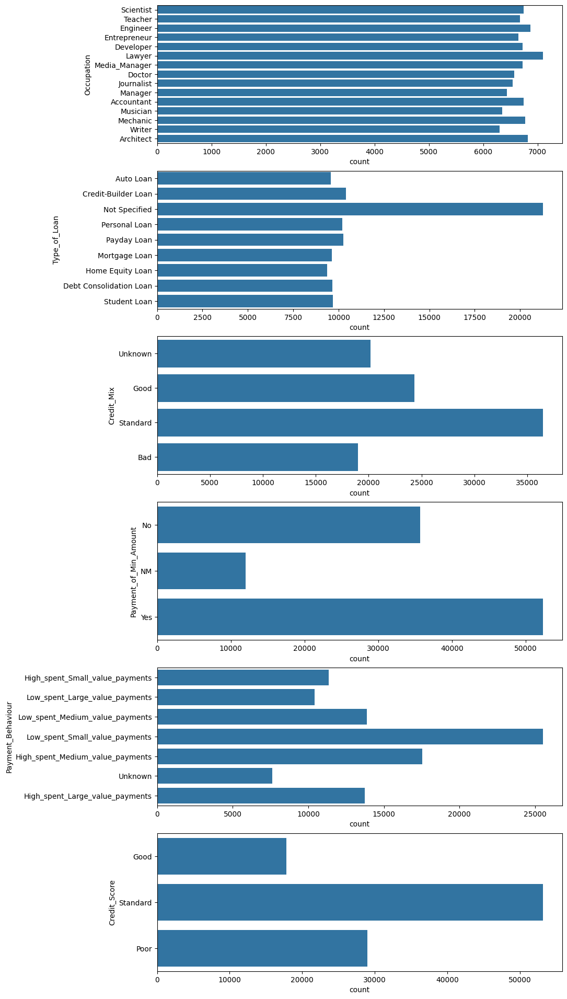

In [40]:
categorical_columns = [
    'Occupation',
    'Type_of_Loan',
    'Credit_Mix',
    'Payment_of_Min_Amount',
    'Payment_Behaviour',
    'Credit_Score'
]

fig, ax = plt.subplots(len(categorical_columns), 1, figsize=(10, 24))
for i, feature in enumerate(categorical_columns):
    sns.countplot(data=cleaned_df, y=feature, ax=ax[i])
plt.show()

- Berdasarkan visualisasi data di atas, terlihat beberapa kategori yang mendominasi dalam suatu feature. Hal ini perlu menjadi catatan tersendiri untuk kita terutama pada feature Credit_Scoring yang didominasi oleh kategori “Standard”. Fenomena ini sering disebut imbalance data yang berpotensi mengakibatkan terjadinya bias. Selanjutnya kita akan melihat visualisasi data numerik.

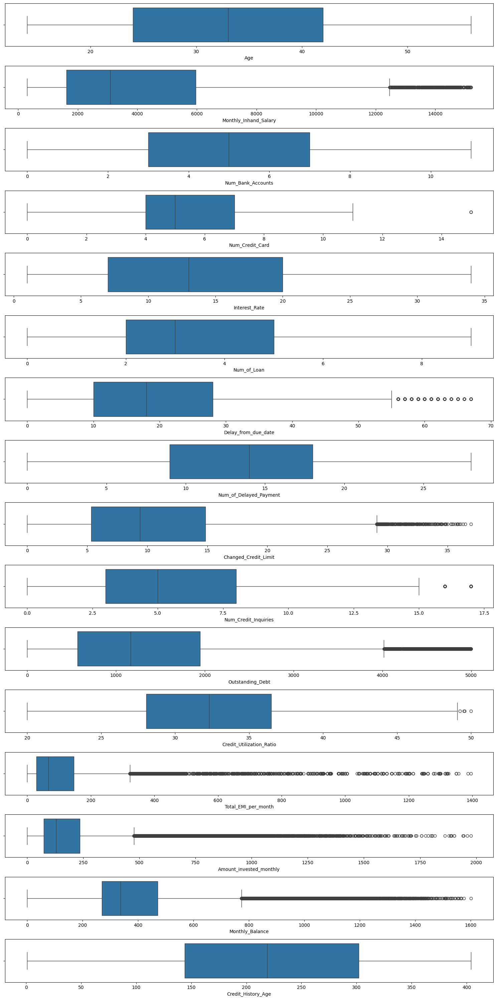

In [41]:
def numerical_dis_plot(features, df, segment_feature=None, showfliers=True):
    fig, ax = plt.subplots(len(features), 1, figsize=(15, 30))
    for i, feature in enumerate(features):
        if segment_feature:
            sns.boxplot(y=segment_feature, x=feature, data=df, ax=ax[i], showfliers=showfliers)
            ax[i].set_ylabel(None)
        else:
            sns.boxplot(x=feature, data=df, ax=ax[i], showfliers=showfliers)
    plt.tight_layout()
    plt.show()

numerical_dis_plot(
    numerical_columns, 
    cleaned_df
)

- Pada visualisasi data di atas terlihat beberapa feature yang memiliki outlier seperti pada feature Monthly_Inhand_Salary. Hal ini terjadi karena terdapat beberapa pelanggan yang memiliki pendapatan per bulan yang jauh lebih besar ketimbang pelanggan pada umumnya. Outlier seperti ini dapat kita abaikan terlebih dahulu. Sekarang kita akan melihat distribusi fitur yang dikelompok berdasarkan Credit_Score.

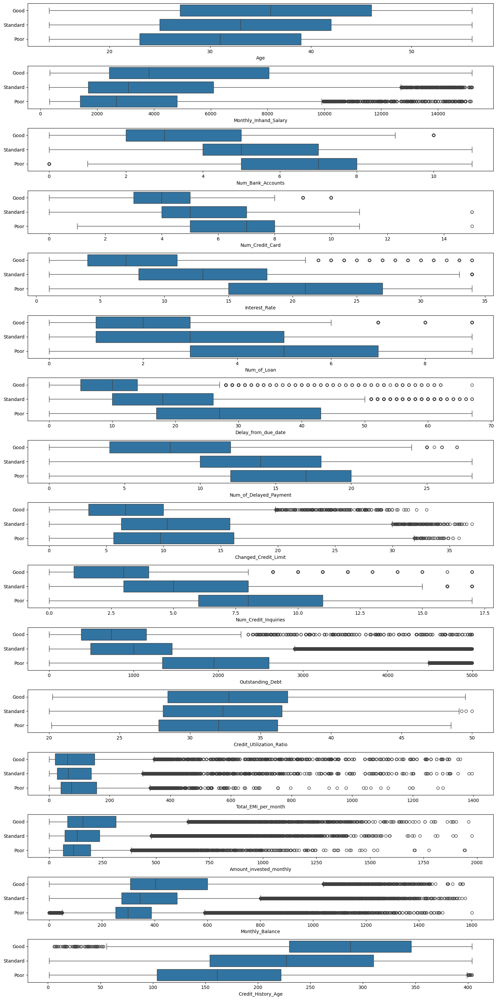

In [42]:
numerical_dis_plot(
    features=numerical_columns,
    df=cleaned_df,
    segment_feature='Credit_Score'
)

- Dari visualisasi tersebut, terdapat beberapa insight berikut:
    - Pelanggan yang memiliki credit score baik (Good) cenderung memiliki umur yang lebih tua. Hal ini juga sejalan dengan usia riwayat kredit dari seorang pelanggan. Semakin besar usia riwayat kredit seorang pelanggan, semakin baik pula credit score yang dimiliki oleh pelanggan tersebut.  
    - Pelanggan dengan credit score yang buruk (Poor) cenderung memiliki banyak akun bank, banyak kartu kredit, jumlah utang yang banyak, serta jumlah bunga kartu kredit yang tinggi. Selain itu, mereka juga cenderung untuk melakukan penunggakan pembayaran. Hal ini terlihat pada kolom Delay_from_due_date dan Num_of_Delayed_Payment. 
    - Selain itu, kita juga perlu mencatat bahwa tidak terdapat pola yang menarik pada feature pada feature Credit_Utilization_Ratio sehingga kita perlu mempertimbangkan penggunaan dari feature tersebut.

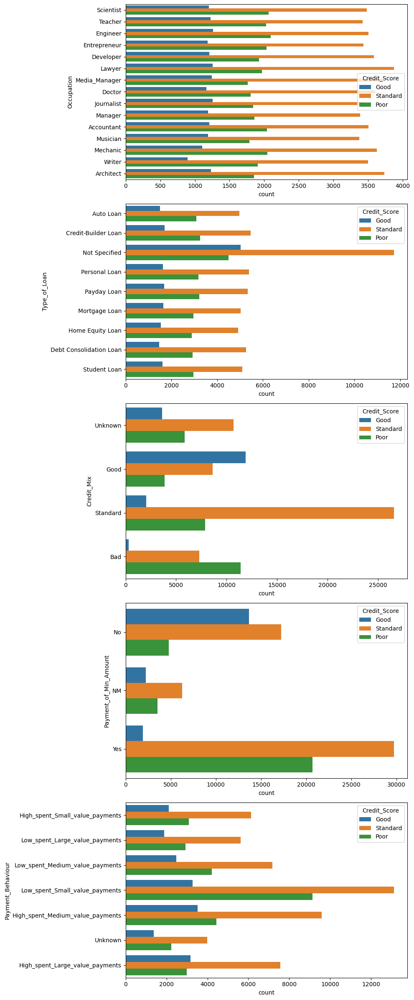

In [43]:
def categorical_dis_plot(features, df, segment_feature=None):
    fig, ax = plt.subplots(len(features), 1, figsize=(10, 24))
    for i, feature in enumerate(features):
        if segment_feature:
            sns.countplot(y=feature, data=df, hue=segment_feature, ax=ax[i])
        else:
            sns.countplot(y=feature, data=df, ax=ax[i])
    plt.tight_layout()
    plt.show()

categorical_dis_plot(
    features=[
        'Occupation',
        'Type_of_Loan',
        'Credit_Mix',
        'Payment_of_Min_Amount',
        'Payment_Behaviour'
    ],
    df=cleaned_df,
    segment_feature='Credit_Score'
)

- Pada visualisasi data di atas, terdapat beberapa pola menarik antara lain seperti di bawah ini:
    - Pelanggan dengan credit score baik (Good) memiliki kemampuan dalam mengelola kredit secara baik. Hal ini terlihat pada kolom Credit_Mix. 
    - Pelanggan dengan credit score yang buruk (Poor) dan standar cenderung hanya melakukan pembayaran dengan jumlah minimum seperti yang terlihat pada kolom Payment_of_Min_Amount.
    - Pelanggan dengan credit score yang buruk (Poor) dan standar, biasanya memiliki profil “Low_spent_Small_value_payments” pada feature Payment_Behaviour.
    - Di sisi lain, hasil visualisasi dari feature Occupation dan Type_of_Loan tidak terdapat pola yang menarik. Oleh karena itu, kita perlu mempertimbangkan penggunaan kedua feature tersebut untuk melatih model nantinya.

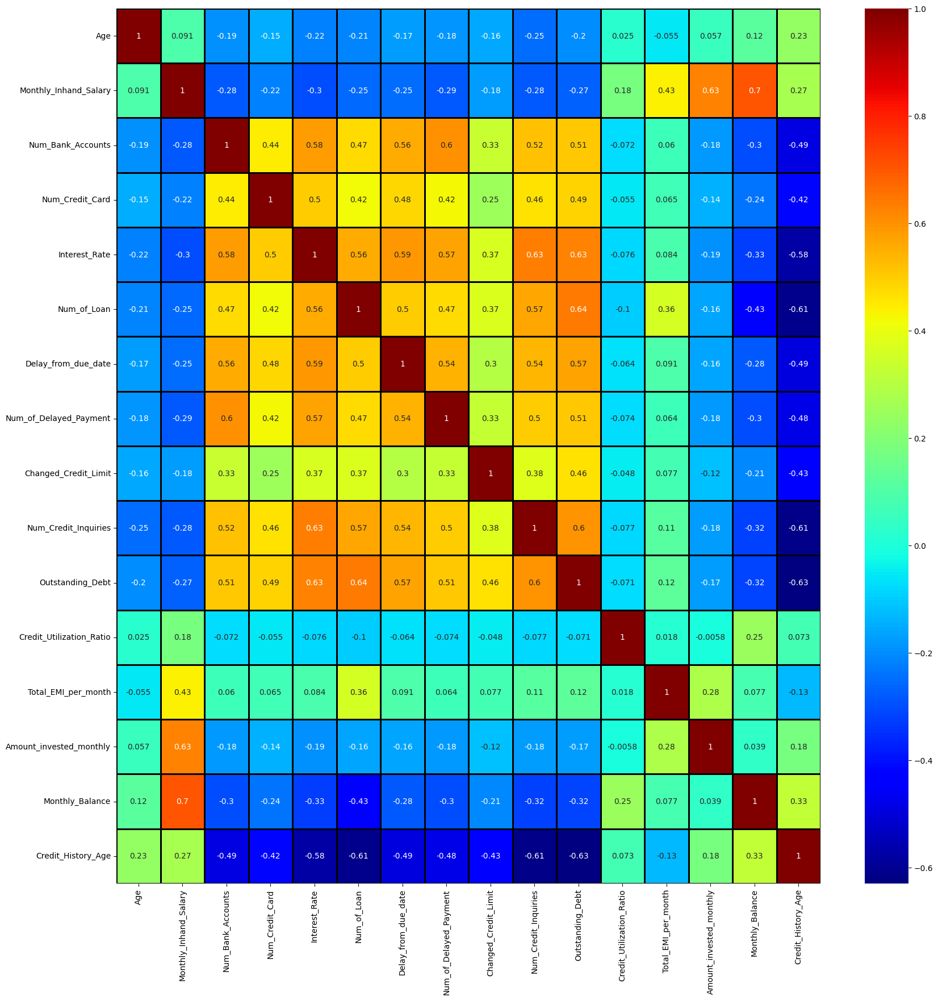

In [44]:
plt.figure(figsize=(20, 20))
sns.heatmap(new_df[numerical_columns].corr(), annot=True, cmap='jet', linecolor='black', linewidth=1)
plt.show()

- Pada visualisasi data di atas, terlihat beberapa fitur yang saling berkorelasi secara positif maupun negatif. Hal ini menandakan adanya multikolinearitas pada dataset yang kita miliki. Masalah multikolinearitas ini akan kita selesaikan pada tahap data preprocessing. 

In [46]:
cleaned_df.to_csv('../data/cleaned_train.csv', index=False)

## Data Preprocessing

### Train Test Split

- Pada praktiknya pembagian train dan test ini 80:20. Namun, pada proyek ini dikarenakan data yang dimiliki cukup besar, kita akan menggunakan pembagian 95:5. Ini disebabkan jika sample uji sebesar 20.000 data dan sample latih sebesar 80.000 data, itu merupakan proporsi yang cukup besar untuk data uji. Oleh karena itu, kita akan menggunakan pembagian 95:5.

In [5]:
new_cleaned_df = pd.read_csv('../data/cleaned_train.csv')
new_cleaned_df = new_cleaned_df.drop(columns=['Customer_ID', 'Month', 'Occupation', 'Type_of_Loan', 'Credit_Utilization_Ratio'], axis=1)
new_cleaned_df.head()

,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,23.0,1824.843333,3.0,4.0,3.0,4.0,3.0,7.0,11.27,4.0,Unknown,809.98,265.0,No,49.574949,80.415295,High_spent_Small_value_payments,312.494089,Good
1,23.0,1824.843333,3.0,4.0,3.0,4.0,0.0,6.0,11.27,4.0,Good,809.98,265.0,No,49.574949,118.280222,Low_spent_Large_value_payments,284.629162,Good
2,23.0,1824.843333,3.0,4.0,3.0,4.0,3.0,7.0,11.27,4.0,Good,809.98,267.0,No,49.574949,81.699521,Low_spent_Medium_value_payments,331.209863,Good
3,23.0,1824.843333,3.0,4.0,3.0,4.0,5.0,4.0,6.27,4.0,Good,809.98,268.0,No,49.574949,199.458074,Low_spent_Small_value_payments,223.451310,Good
4,23.0,1824.843333,3.0,4.0,3.0,4.0,6.0,6.0,11.27,4.0,Good,809.98,269.0,No,49.574949,41.420153,High_spent_Medium_value_payments,341.489231,Good


In [6]:
train_df, test_df = train_test_split(new_cleaned_df, test_size=0.05, random_state=42, shuffle=True)
train_df.reset_index(drop=True, inplace=True)
test_df.reset_index(drop=True, inplace=True)

print(train_df.shape)
print(test_df.shape)

(95000, 19)
(5000, 19)


- Kode di atas akan membagi new_cleaned_df menjadi dua bagian (train_df dan test_df) dengan proporsi 95:5. Proses pembagian ini dilakukan secara acak (shuffle=True) untuk memastikan semua keadaan yang terdapat dalam dataset dapat terwakilkan dengan baik.

### Undersampling

- Pada proses EDA sebelumnya, diketahui Credit_Score didominasi oleh "Standard". Ini menunjukkan adanya imbalance data. Oleh karena itu, kita akan menggunakan teknik undersampling untuk menyeimbangkan data. Digunakan undersampling karena data yang cukup besar dan menghindari duplikasi data.

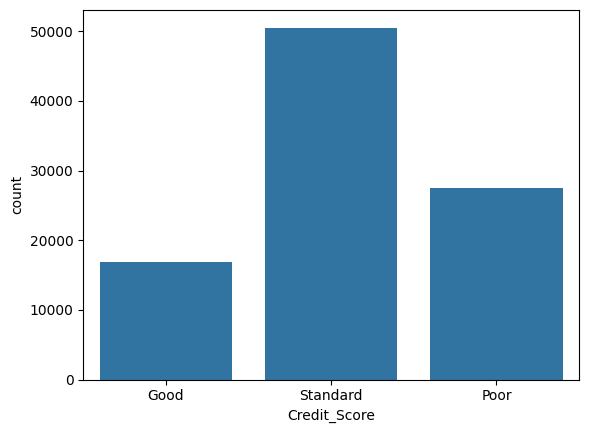

In [7]:
sns.countplot(data=train_df, x='Credit_Score')
plt.show()

In [8]:
train_df.Credit_Score.value_counts()

Credit_Score
Standard    50525
Poor        27539
Good        16936
Name: count, dtype: int64

- Sekarang kita kelompokkan data berdasarkan Credit_Score.

In [9]:
df_majority_1 = train_df[train_df.Credit_Score == 'Standard']
df_majority_2 = train_df[train_df.Credit_Score == 'Poor']
df_minority = train_df[train_df.Credit_Score == 'Good']

- Selanjutnya kita akan melakukan resampling yaitu mengambil sample dari sample data yang ada.

In [10]:
df_majority_1_undersampled = resample(df_majority_1, n_samples=16936, random_state=42)
df_majority_2_undersampled = resample(df_majority_2, n_samples=16936, random_state=42)
print(df_majority_1_undersampled.shape)
print(df_majority_2_undersampled.shape)

(16936, 19)
(16936, 19)


- Lalu, kita akan menggabungkan data yang sudah di resampling. Selain itu, kita perlu memastikan data gabungan tersebut diacak menggunakan function shuffle.

In [11]:
undersampled_train_df = pd.concat([df_minority, df_majority_1_undersampled]).reset_index(drop=True)
undersampled_train_df = pd.concat([undersampled_train_df, df_majority_2_undersampled]).reset_index(drop=True)
undersampled_train_df = shuffle(undersampled_train_df, random_state=42)
undersampled_train_df.reset_index(drop=True, inplace=True)
undersampled_train_df.sample(5)

,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
37338,39.0,1302.6525,9.0,6.0,18.0,5.0,51.0,18.0,17.49,11.0,Bad,3120.15,158.0,Yes,32.294054,57.931014,Low_spent_Medium_value_payments,320.040182,Poor
24831,29.0,3469.8000,9.0,10.0,20.0,2.0,37.0,28.0,7.03,6.0,Bad,1312.04,160.0,NM,36.437576,74.959213,High_spent_Large_value_payments,475.583211,Poor
26514,47.0,6889.0225,2.0,3.0,9.0,4.0,12.0,6.0,11.56,3.0,Good,840.94,385.0,No,159.809637,256.462553,High_spent_Medium_value_payments,522.630060,Good
12757,28.0,1484.0525,5.0,6.0,20.0,4.0,21.0,9.0,10.73,7.0,Standard,1072.32,197.0,No,42.825854,168.587959,Low_spent_Small_value_payments,226.991437,Standard
38312,29.0,3811.3350,8.0,4.0,33.0,3.0,12.0,16.0,11.02,8.0,Standard,1595.76,221.0,Yes,89.911090,375.892706,Unknown,195.329703,Poor


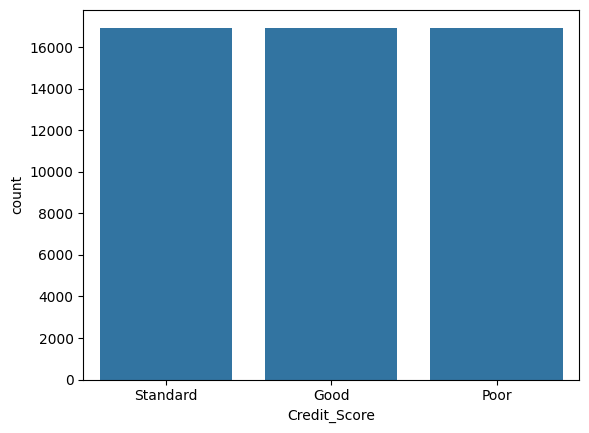

In [12]:
sns.countplot(data=undersampled_train_df, x='Credit_Score')
plt.show()

### Encoding dan Scaling

- Untuk melakukan encoding dan scaling, kita perlu memisahkan antara fitur train dan target.

In [13]:
X_train = undersampled_train_df.drop(columns='Credit_Score', axis=1)
y_train = undersampled_train_df['Credit_Score']

X_test = test_df.drop(columns='Credit_Score', axis=1)
y_test = test_df['Credit_Score']

- Lalu lakukan encoding pada data kategorikal menggunakan LabelEncoder dan scaling pada data numerik menggunakan MinMaxScaler.

In [14]:
def scaling(features, df, df_test=None):
    if df_test is not None:
        df = df.copy()
        df_test = df_test.copy()
        for feature in features:
            scaler = MinMaxScaler()
            X = np.asanyarray(df[feature])
            X = X.reshape(-1, 1)
            scaler.fit(X)
            df['{}'.format(feature)] = scaler.transform(X)
            joblib.dump(scaler, './models/scaler_{}.joblib'.format(feature))

            X_test = np.asanyarray(df_test[feature])
            X_test = X_test.reshape(-1, 1)
            df_test['{}'.format(feature)] = scaler.transform(X_test)
        return df, df_test
    else:
        df = df.copy()
        for feature in features:
            scaler = MinMaxScaler()
            X = np.asanyarray(df[feature])
            X = X.reshape(-1, 1)
            scaler.fit(X)
            df['{}'.format(feature)] = scaler.transform(X)
            joblib.dump(scaler, './models/scaler_{}.joblib'.format(feature))
        return df

def encoding(features, df, df_test=None):
    if df_test is not None:
        df = df.copy()
        df_test = df_test.copy()
        for feature in features:
            encoder = LabelEncoder()
            encoder.fit(df[feature])
            df['{}'.format(feature)] = encoder.transform(df[feature])
            joblib.dump(encoder, 'models/encoder_{}.joblib'.format(feature))

            df_test['{}'.format(feature)] = encoder.transform(df_test[feature])
        return df, df_test
    else:
        df = df.copy()
        for feature in features:
            encoder = LabelEncoder()
            encoder.fit(df[feature])
            df['{}'.format(feature)] = encoder.transform(df[feature])
            joblib.dump(encoder, 'models/encoder_{}.joblib'.format(feature))
        return df

- Function scaling() digunakan untuk melakukan proses scaling dengan metode Min-max scaling (memanfaatkan MinMaxScaler() dari scikit learn). Ia merupakan metode scaling menggunakan nilai minimum dan maksimum yang terdapat dalam sebuah feature dan mengubah data dalam feature tersebut ke dalam skala 0-1. Selain itu, function ini juga akan menyimpan object yang digunakan untuk melakukan proses scaling pada setiap feature dalam sebuah berkas dengan format .joblib. Berkas ini akan sangat berguna untuk menjalankan proses data preprocessing dalam lingkup produksi atau deployment.
- Pada function encoding(), kita akan melakukan proses encoding pada seluruh feature kategorik dengan bantuan LabelEncoder() dari scikit learn. Pada function ini juga kita akan menyimpan setiap object yang digunakan untuk melakukan proses scaling pada suatu feature kategorik. Tujuannya agar proses ini dapat dilakukan dalam lingkup deployment dengan hasil yang konsisten.

In [15]:
numerical_columns = [
    'Age',
    'Monthly_Inhand_Salary',
    'Num_Bank_Accounts',
    'Num_Credit_Card',
    'Interest_Rate',
    'Num_of_Loan',
    'Delay_from_due_date',
    'Num_of_Delayed_Payment',
    'Changed_Credit_Limit',
    'Num_Credit_Inquiries',
    'Outstanding_Debt',
    'Total_EMI_per_month',
    'Amount_invested_monthly',
    'Monthly_Balance',
    'Credit_History_Age'
]
 
categorical_columns = [
    'Credit_Mix',
    'Payment_of_Min_Amount', 
    'Payment_Behaviour'
]

new_train_df, new_test_df = scaling(numerical_columns, X_train, X_test)
new_train_df, new_test_df = encoding(categorical_columns, new_train_df, new_test_df)

- Selanjutnya, kita perlu encoding fitur target.

In [16]:
encoder = LabelEncoder()
encoder.fit(y_train)
new_y_train = encoder.transform(y_train)
joblib.dump(encoder, 'models/encoder_target.joblib')

new_y_test = encoder.transform(y_test)

### PCA (Principal Component Analysis)

- Principal Component Analysis atau PCA merupakan salah satu teknik reduksi (pengurangan) dimensi yang umum digunakan di industri. Ia merupakan prosedur yang mengurangi jumlah fitur dengan tetap mempertahankan informasi pada data. PCA adalah teknik untuk mereduksi dimensi, mengekstraksi fitur, dan mentransformasi data dari “n-dimensional space” ke dalam sistem berkoordinat baru dengan dimensi m, di mana m lebih kecil dari n. 
- Teknik PCA ini, umumnya digunakan untuk mereduksi feature asli menjadi sejumlah kecil feature baru yang tidak berkorelasi linier. Feature baru tersebut disebut komponen utama (PC). Idealnya, komponen utama ini dapat menangkap sebagian besar varians (berkorelasi dengan informasi) dalam feature asli sehingga saat teknik PCA diterapkan pada suatu data, ia hanya akan menggunakan komponen utama untuk merepresentasikan data asli.

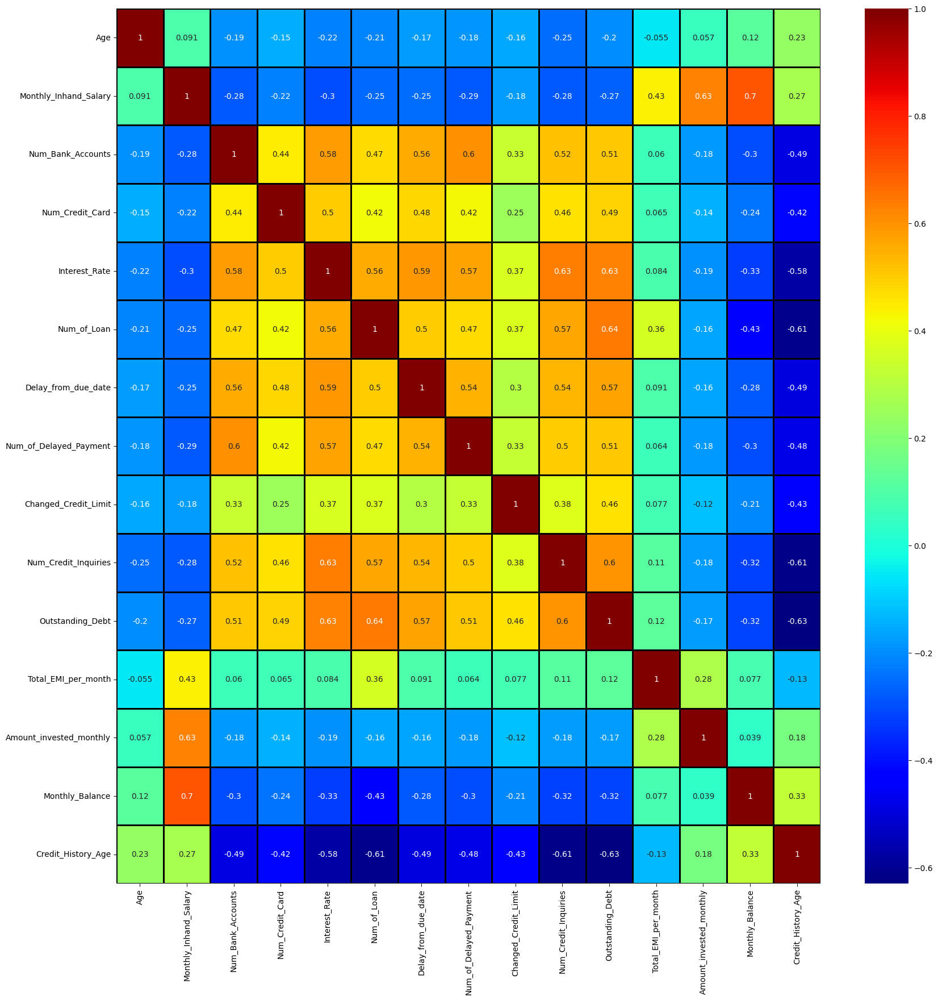

In [17]:
plt.figure(figsize=(20, 20))
sns.heatmap(new_cleaned_df[numerical_columns].corr(), annot=True, cmap='jet', linecolor='black', linewidth=1)
plt.show()

- Sebelum melakukan PCA, kita perlu mengelompokan komponen yang berkorelasi terlebih dahulu seperti yang ditunjukan pada gambar di atas.

In [18]:
pca_numerical_columns_1 = [
    'Num_Bank_Accounts',
    'Num_Credit_Card',
    'Interest_Rate',
    'Num_of_Loan',
    'Delay_from_due_date',
    'Num_of_Delayed_Payment',
    'Changed_Credit_Limit',
    'Num_Credit_Inquiries',
    'Outstanding_Debt',
    'Credit_History_Age'
]
 
pca_numerical_columns_2 = [
    'Monthly_Inhand_Salary',
    'Monthly_Balance', 
    'Amount_invested_monthly', 
    'Total_EMI_per_month'
]

- Setelah dikelompokkan, kita perlu menyiapkan dataframe baru untuk menyimpan hasil PCA.

In [19]:
train_pca_df = new_train_df.copy().reset_index(drop=True)
test_pca_df = new_test_df.copy().reset_index(drop=True)

- Sekarang kita akan melakukan PCA terhadap kelompok fitur pertama. Untuk melakukannya, kita pertama perlu mencari jumlah komponen utama yang optimal.

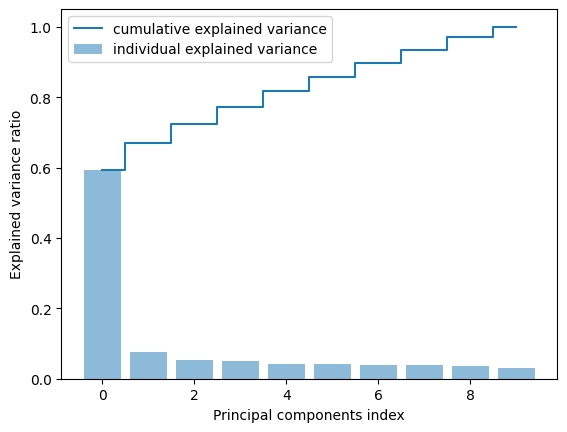

In [20]:
pca = PCA(n_components=len(pca_numerical_columns_1), random_state=123)
pca.fit(train_pca_df[pca_numerical_columns_1])
princ_comp = pca.transform(train_pca_df[pca_numerical_columns_1])

var_exp = pca.explained_variance_ratio_.round(3)
cum_var_exp = np.cumsum(var_exp)

plt.bar(range(len(pca_numerical_columns_1)), var_exp, alpha=0.5, align='center', label='individual explained variance')
plt.step(range(len(pca_numerical_columns_1)), cum_var_exp, where='mid', label='cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components index')
plt.legend(loc='best')
plt.show()

- Gambar di atas menunjukkan visualisasi jumlah varians untuk setiap jumlah komponen utama. Berdasarkan gambar tersebut terlihat bahwa, dengan hanya mengambil 5 komponen utama kita telah memperoleh lebih dari 80% varians. Ini berarti kita bisa mewakili seluruh kelompok feature tersebut (ada 9 feature) hanya dengan 5 komponen utama.

In [21]:
pca_1 = PCA(n_components=5, random_state=123)
pca_1.fit(train_pca_df[pca_numerical_columns_1])
joblib.dump(pca_1, 'models/pca_{}.joblib'.format(1))
princ_comp_1 = pca_1.transform(train_pca_df[pca_numerical_columns_1])
train_pca_df[['pc1_1', 'pc1_2', 'pc1_3', 'pc1_4', 'pc1_5']] = pd.DataFrame(princ_comp_1, columns=['pc1_1', 'pc1_2', 'pc1_3', 'pc1_4', 'pc1_5'])
train_pca_df.drop(columns=pca_numerical_columns_1, axis=1, inplace=True)
train_pca_df.head()

,Age,Monthly_Inhand_Salary,Credit_Mix,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,pc1_1,pc1_2,pc1_3,pc1_4,pc1_5
0,0.690476,0.237662,2,2,0.113024,0.025093,0,0.266400,0.215967,-0.335006,0.056187,-0.047697,0.147047
1,0.190476,0.503576,1,1,0.111900,0.080054,0,0.451454,-0.319090,-0.112741,0.227276,-0.055502,0.117496
2,0.428571,0.090128,1,1,0.033189,0.021363,3,0.221049,-0.419284,-0.069814,0.232473,0.110948,0.250861
3,0.476190,0.126136,1,0,0.060780,0.020599,0,0.212522,-0.257280,0.237472,0.376891,0.068669,0.012678
4,0.452381,0.104396,1,1,0.050268,0.082627,5,0.155497,-0.502601,-0.073807,0.226035,0.284458,-0.015841


- Sekarang kita akan melakukan proses yang sama untuk kelompok data berikutnya.

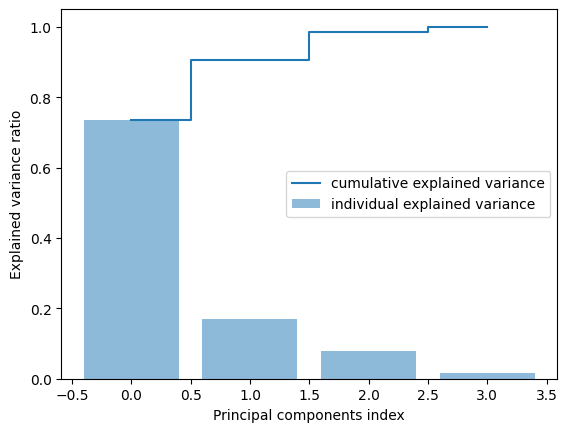

In [22]:
pca = PCA(n_components=len(pca_numerical_columns_2), random_state=123)
pca.fit(train_pca_df[pca_numerical_columns_2])
princ_comp = pca.transform(train_pca_df[pca_numerical_columns_2])

var_exp = pca.explained_variance_ratio_.round(3)
cum_var_exp = np.cumsum(var_exp)

plt.bar(range(len(pca_numerical_columns_2)), var_exp, alpha=0.5, align='center', label='individual explained variance')
plt.step(range(len(pca_numerical_columns_2)), cum_var_exp, where='mid', label='cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components index')
plt.legend(loc='best')
plt.show()

- Berdasarkan grafik tersebut terlihat bahwa hanya dengan menggunakan 2 komponen utama kita telah memperoleh 90% varians. Hal ini berarti kita bisa mewakili sebagian besar informasi dari seluruh feature pada kelompok ini (ada 4 feature) hanya menggunakan dua komponen utama.

In [23]:
pca_2 = PCA(n_components=2, random_state=123)
pca_2.fit(train_pca_df[pca_numerical_columns_2])
joblib.dump(pca_2, 'models/pca_{}.joblib'.format(2))
princ_comp_2 = pca_2.transform(train_pca_df[pca_numerical_columns_2])
train_pca_df[['pc2_1', 'pc2_2']] = pd.DataFrame(princ_comp_2, columns=['pc2_1', 'pc2_2'])
train_pca_df.drop(columns=pca_numerical_columns_2, axis=1, inplace=True)
train_pca_df.head()

,Age,Credit_Mix,Payment_of_Min_Amount,Payment_Behaviour,pc1_1,pc1_2,pc1_3,pc1_4,pc1_5,pc2_1,pc2_2
0,0.690476,2,2,0,0.215967,-0.335006,0.056187,-0.047697,0.147047,-0.041153,-0.042993
1,0.190476,1,1,0,-0.319090,-0.112741,0.227276,-0.055502,0.117496,0.278922,-0.109200
2,0.428571,1,1,3,-0.419284,-0.069814,0.232473,0.110948,0.250861,-0.200170,-0.056832
3,0.476190,1,0,0,-0.257280,0.237472,0.376891,0.068669,0.012678,-0.168846,-0.037691
4,0.452381,1,1,5,-0.502601,-0.073807,0.226035,0.284458,-0.015841,-0.198205,0.034669


- Terakhir kita lakukan PCA ke data uji.

In [24]:
test_princ_comp_1 = pca_1.transform(test_pca_df[pca_numerical_columns_1])
test_pca_df[['pc1_1', 'pc1_2', 'pc1_3', 'pc1_4', 'pc1_5']] = pd.DataFrame(test_princ_comp_1, columns=['pc1_1', 'pc1_2', 'pc1_3', 'pc1_4', 'pc1_5'])
test_pca_df.drop(columns=pca_numerical_columns_1, axis=1, inplace=True)

test_princ_comp_2 = pca_2.transform(test_pca_df[pca_numerical_columns_2])
test_pca_df[['pc2_1', 'pc2_2']] = pd.DataFrame(test_princ_comp_2, columns=['pc2_1', 'pc2_2'])
test_pca_df.drop(columns=pca_numerical_columns_2, axis=1, inplace=True)

test_pca_df.head()

,Age,Credit_Mix,Payment_of_Min_Amount,Payment_Behaviour,pc1_1,pc1_2,pc1_3,pc1_4,pc1_5,pc2_1,pc2_2
0,0.380952,1,1,0,-0.587977,-0.065733,-0.240664,0.074134,0.170567,-0.029592,-0.141671
1,0.095238,0,2,5,0.760531,-0.286918,-0.114280,-0.250767,0.198645,-0.239788,0.016467
2,0.642857,1,1,5,-0.441124,-0.204247,-0.141170,-0.030998,-0.200501,0.627704,0.211694
3,0.500000,2,2,5,0.360242,0.118104,-0.383711,0.236119,-0.240762,-0.196577,-0.059574
4,0.309524,1,1,1,-0.504527,-0.468683,-0.080164,0.094325,-0.195725,0.255807,-0.113497


## Modeling

### Grid Search
- estimator: parameter yang menampung model object
- param_grid: kumpulan hyperparameter yang akan digunakan untuk membuat grid search
- cv: parameter untuk mengatur proses cross-validation
-  n_jobs: jumlah job (pekerjaan) yang dikerjakan secara paralel. Jika -1, artinya semua proses akan dikerjakan secara paralel.

In [27]:
param_grid = {
    'penalty': ['l1', 'l2'],
    'C': [0.01, 0.1, 1]
}

log_model = LogisticRegression(random_state=123)

CV_lr = GridSearchCV(estimator=log_model, param_grid=param_grid, cv=5, n_jobs=-1)
CV_lr.fit(train_pca_df, new_y_train)

c:\Users\ghifarullah19\anaconda3\envs\credit_scoring\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
15 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\ghifarullah19\anaconda3\envs\credit_scoring\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\ghifarullah19\anaconda3\envs\credit_scoring\lib\site-packages\sklearn\linear_model\_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\Users\ghifarullah19\anaconda3\envs\credit_sco

GridSearchCV(cv=5, estimator=LogisticRegression(random_state=123), n_jobs=-1,
             param_grid={'C': [0.01, 0.1, 1], 'penalty': ['l1', 'l2']})

- Pada kode di atas, kita melakukan proses hyperparameter tuning dengan grid search untuk model logistic regression. Terlihat pada bagian param_grid, kita memuat beberapa hyperparameter yang terdapat pada algoritma logistic regression seperti penalty dan C. Keduanya digunakan untuk mengatur proses regularization (teknik untuk mengurangi overfitting) yang terdapat dalam algoritma tersebut. 

### Decision Tree
- random_state: digunakan untuk mengontrol random number generator yang digunakan oleh model.
- max_depth: hyperparameter yang mengatur kedalaman atau panjang pohon keputusan.
- max_features: hyperparameter yang mengatur jumlah maksimum feature yang digunakan untuk mencari percabangan terbaik.
- criterion: metrik yang digunakan untuk mengukur kualitas dari sebuah percabangan.

In [29]:
tree_model = DecisionTreeClassifier(random_state=123)

param_grid = {
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [5, 6, 7, 8],
    'criterion': ['gini', 'entropy']
}

CV_tree = GridSearchCV(estimator=tree_model, param_grid=param_grid, cv=5, n_jobs=-1)
CV_tree.fit(train_pca_df, new_y_train)

c:\Users\ghifarullah19\anaconda3\envs\credit_scoring\lib\site-packages\sklearn\tree\_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=123),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 6, 7, 8],
                         'max_features': ['auto', 'sqrt', 'log2']})

In [30]:
print('best parameters: ', CV_tree.best_params_)

best parameters:  {'criterion': 'entropy', 'max_depth': 6, 'max_features': 'auto'}


In [32]:
tree_model = DecisionTreeClassifier(
    random_state=123,
    criterion='entropy',
    max_depth=6,
    max_features='sqrt' # harusnya 'auto', tapi ini menyesuaikan dengan course
)

tree_model.fit(train_pca_df, new_y_train)
joblib.dump(tree_model, 'models/tree_model.joblib')

['models/tree_model.joblib']

### Random Forest
- random_state: digunakan untuk mengontrol random number generator yang digunakan oleh model.
- max_depth: hyperparameter yang mengatur kedalaman atau panjang pohon keputusan.
- max_features: hyperparameter yang mengatur jumlah maksimum feature yang digunakan untuk mencari percabangan terbaik.
- criterion: metrik yang digunakan untuk mengukur kualitas dari sebuah percabangan.
- n_estimators: hyperparameter yang mengatur jumlah pohon keputusan yang akan digunakan dalam model.

In [35]:
rdf_model = RandomForestClassifier(random_state=123)

param_grid = {
    'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [6, 7, 8],
    'criterion': ['gini', 'entropy']
}

CV_rdf = GridSearchCV(estimator=rdf_model, param_grid=param_grid, cv=5, n_jobs=-1)
CV_rdf.fit(train_pca_df, new_y_train)

c:\Users\ghifarullah19\anaconda3\envs\credit_scoring\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=123),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [6, 7, 8],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [200, 500]})

In [36]:
print('best parameters: ', CV_rdf.best_params_)

best parameters:  {'criterion': 'gini', 'max_depth': 8, 'max_features': 'auto', 'n_estimators': 500}


In [37]:
rdf_model = RandomForestClassifier(
    random_state=123,
    max_depth=8,
    n_estimators=500,
    max_features='sqrt', # harusnya 'auto', tapi ini menyesuaikan dengan course
    criterion='gini',
    n_jobs=-1
)

rdf_model.fit(train_pca_df, new_y_train)
joblib.dump(rdf_model, 'models/rdf_model.joblib')

['models/rdf_model.joblib']

### Gradient Boosting
- random_state: digunakan untuk mengontrol random number generator yang digunakan oleh model.
- max_depth: hyperparameter yang mengatur kedalaman atau panjang pohon keputusan.
- max_features: hyperparameter yang mengatur jumlah maksimum feature yang digunakan untuk mencari percabangan terbaik.
- n_estimators: hyperparameter yang mengatur jumlah pohon keputusan yang akan digunakan dalam model.
- learning_rate: hyperparameter yang mengatur seberapa besar kontribusi dari setiap pohon keputusan dalam model.

In [40]:
gboost_model = GradientBoostingClassifier(random_state=123)

param_grid = {
    'max_depth': [5, 8],
    'n_estimators': [200, 300],
    'learning_rate': [0.01, 0.1],
    'max_features': ['auto', 'sqrt', 'log2']
}

CV_gboost = GridSearchCV(estimator=gboost_model, param_grid=param_grid, cv=5, n_jobs=-1)
CV_gboost.fit(train_pca_df, new_y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=123),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1], 'max_depth': [5, 8],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [200, 300]})

In [41]:
print('best parameters: ', CV_gboost.best_params_)

best parameters:  {'learning_rate': 0.1, 'max_depth': 8, 'max_features': 'sqrt', 'n_estimators': 300}


In [42]:
gboost_model = GradientBoostingClassifier(
    random_state=123,
    learning_rate=0.1,
    max_depth=8,
    max_features='sqrt',
    n_estimators=300
)

gboost_model.fit(train_pca_df, new_y_train)
joblib.dump(gboost_model, 'models/gboost_model.joblib')

['models/gboost_model.joblib']

## Evaluation

### Confusion Matrix
- Pada problem classification, salah satu metrik utama yang harus diperhatikan adalah confusion matrix. Metrik ini akan memberi gambaran performa model pada berbagai kelas. Ia menunjukkan berapa banyak jumlah prediksi yang benar (True) dan salah (False) untuk setiap label. Berikut merupakan contoh ilustrasi confusion matrix untuk multiclass classification.
![confusion_matrix](img/confusion_matrix.png)
- Berdasarkan hasil di atas, kita dapat melihat seberapa baik performa model untuk melakukan prediksi pada setiap kelas atau label. Hal ini akan sangat berguna terutama ketika berhadapan dengan data yang memiliki kelas tidak seimbang (imbalance data). Selain itu, hasil dari confusion matrix ini akan digunakan untuk menghitung berbagai metrik lain seperti accuracy, precision, dll.

### Accuracy
- Metrik berikutnya yang sering digunakan adalah accuracy. Metrik ini akan menilai seberapa banyak model menghasilkan hasil prediksi yang benar. Ia didefinisikan sebagai perbandingan antara jumlah prediksi yang benar dengan jumlah total seluruh sampel.
![accuracy](img/accuracy.png)

### Precision
- Precision merupakan metrik yang digunakan untuk mengukur berapa banyak model menghasilkan prediksi yang benar untuk suatu kelas tertentu. Precision didefinisikan sebagai perbandingan antara jumlah hasil prediksi yang benar untuk kelas tertentu dengan jumlah total prediksi untuk kelas tersebut.
![precision](img/precision.png)

### Recall
- Recall didefinisikan sebagai perbandingan antara jumlah hasil prediksi yang benar untuk kelas tertentu dengan jumlah total sampel pada kelas tersebut.
![recall](img/recall.png)

### F1 score
- Metrik ini merupakan kombinasi antara nilai precision dan recall dari suatu kelas tertentu.
![f1_score](img/f1_score.png)

### Evaluasi Model
- Berikut adalah helper function untuk mengevaluasi ketiga model yang sebelumnya telah dilatih.

In [43]:
def evaluating(y_pred, y_true):
    '''Evaluasi Model'''
    labels = ['Good', 'Poor', 'Standard']

    print(classification_report(y_pred=y_pred, y_true=y_true))

    cnf_matrix =  confusion_matrix(y_pred=y_pred, y_true=y_true, labels=labels)
    cnf_matrix_df = pd.DataFrame(cnf_matrix, labels, labels)
    sns.heatmap(cnf_matrix_df, annot=True, annot_kws={"size": 14}, fmt='d', cmap='YlGnBu')
    plt.ylabel('True label', fontsize=15)
    plt.xlabel('Predicted label', fontsize=15)
    plt.show()

    return cnf_matrix_df

- Sekarang kita akan coba mengevaluasi model pertama yaitu decision tree. Untuk melakukannya, kita perlu membuat hasil prediksi dari data testing terlebih dahulu dengan menggunakan method predict(). Kemudian kita perlu mengubah hasil prediksi ke dalam label yang sesuai (Good, Poor, Standard) dengan menggunakan encoder.inverse_transform().

In [44]:
y_pred_test = tree_model.predict(test_pca_df)
y_pred_test = encoder.inverse_transform(y_pred_test)

- Kode di atas akan menghasilkan prediksi yang disimpan dalam variabel y_pred_train. Hasil ini selanjutnya akan dievaluasi menggunakan helper function evaluating() yang sebelumnya telah kita buat. 

              precision    recall  f1-score   support

        Good       0.49      0.82      0.62       892
        Poor       0.62      0.70      0.66      1459
    Standard       0.81      0.57      0.67      2649

    accuracy                           0.65      5000
   macro avg       0.64      0.70      0.65      5000
weighted avg       0.70      0.65      0.66      5000



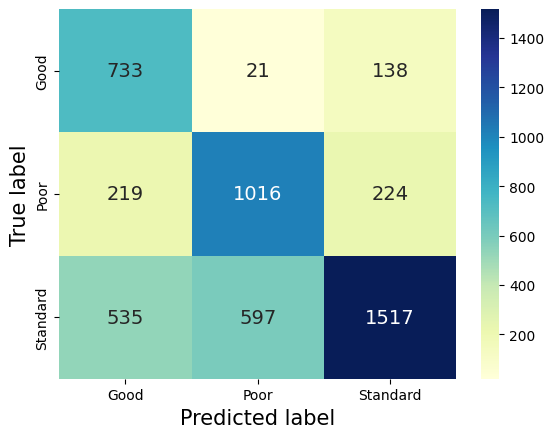

,Good,Poor,Standard
Good,733,21,138
Poor,219,1016,224
Standard,535,597,1517


In [46]:
evaluating(y_pred=y_pred_test, y_true=y_test)

- Sekarang kita melakukan tahapan yang sama persis untuk mengevaluasi model random forest.

              precision    recall  f1-score   support

        Good       0.50      0.83      0.62       892
        Poor       0.64      0.74      0.68      1459
    Standard       0.83      0.58      0.68      2649

    accuracy                           0.67      5000
   macro avg       0.66      0.71      0.66      5000
weighted avg       0.71      0.67      0.67      5000



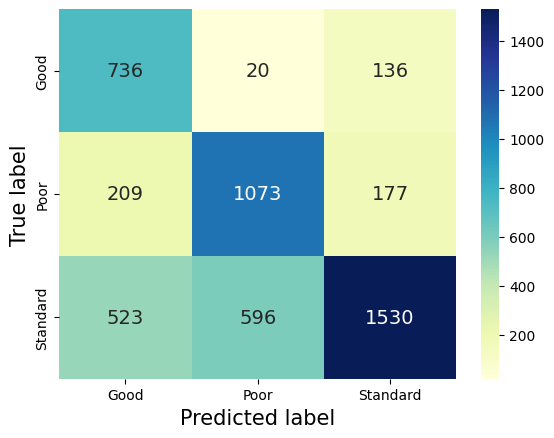

,Good,Poor,Standard
Good,736,20,136
Poor,209,1073,177
Standard,523,596,1530


In [47]:
y_pred_test = rdf_model.predict(test_pca_df)
y_pred_test = encoder.inverse_transform(y_pred_test)

evaluating(y_pred=y_pred_test, y_true=y_test)

- Terakhir, kita juga perlu melakukan hal yang sama untuk mengevaluasi performa model gradient boosting.

              precision    recall  f1-score   support

        Good       0.53      0.84      0.65       892
        Poor       0.68      0.74      0.71      1459
    Standard       0.83      0.62      0.71      2649

    accuracy                           0.69      5000
   macro avg       0.68      0.73      0.69      5000
weighted avg       0.73      0.69      0.70      5000



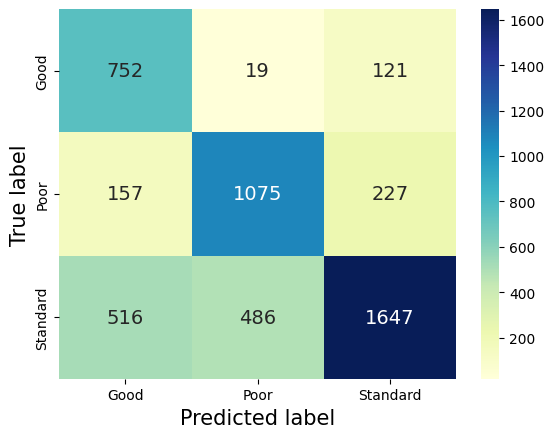

,Good,Poor,Standard
Good,752,19,121
Poor,157,1075,227
Standard,516,486,1647


In [48]:
y_pred_test = gboost_model.predict(test_pca_df)
y_pred_test = encoder.inverse_transform(y_pred_test)

evaluating(y_pred=y_pred_test, y_true=y_test)

- Jika kita perhatikan, dari ketiga model tersebut belum ada model yang memiliki performa yang sangat baik dalam menangani data uji. Idealnya, pada tahap ini kita perlu memperbaiki performa dari ketiga model tersebut dengan cara meningkatkan kualitas data atau bahkan melakukan eksperimen dengan algoritma model yang lebih kompleks. 
- Namun, pada proyek ini kita akan tetap melanjutkannya dengan ketiga model tersebut. Oleh karena itu, kita perlu memilih salah satu dari ketiga model tersebut. Jika dilihat berdasarkan metrik accuracy, model yang memiliki performa terbaiknya adalah gradient boosting. Selain melihat dari metrik accuracy, kita juga perlu mempertimbangkan metrik yang lain. Apabila dilihat berdasarkan metrik yang lain, terlihat bahwa model dengan performa terbaik adalah gradient boosting. 
- Nah, selain melihat berdasarkan metrik tersebut, kita juga perlu mempertimbangkan dari segi bisnis. Untuk melakukannya, kita perlu memahami business model beserta objektif dari perusahaan tersebut. Sebagai contoh, pada proyek ini kita ingin mengidentifikasi credit scoring dari setiap pelanggan. Tentunya akan sangat bahaya bagi perusahaan jika salah mengidentifikasi orang dengan credit scoring yang buruk. Oleh karena itu, kita perlu melihat performa model dalam mengidentifikasi pelanggan yang memiliki credit scoring yang buruk. Jika dilihat dari hasil evaluasi di atas, terlihat bahwa model gradient boosting memiliki performa yang paling baik dalam mengidentifikasi pelanggan yang memiliki credit scoring yang buruk.
- Jadi, berdasarkan hasil evaluasi ini, dapat disimpulkan bahwa model dengan performa terbaik adalah gradient boosting. Model inilah yang akan kita gunakan dalam membuat prototype sederhana untuk mengidentifikasi risiko kredit pelanggan. Agar dapat digunakan kembali, kita perlu menyimpan model tersebut.

### Feature Importance

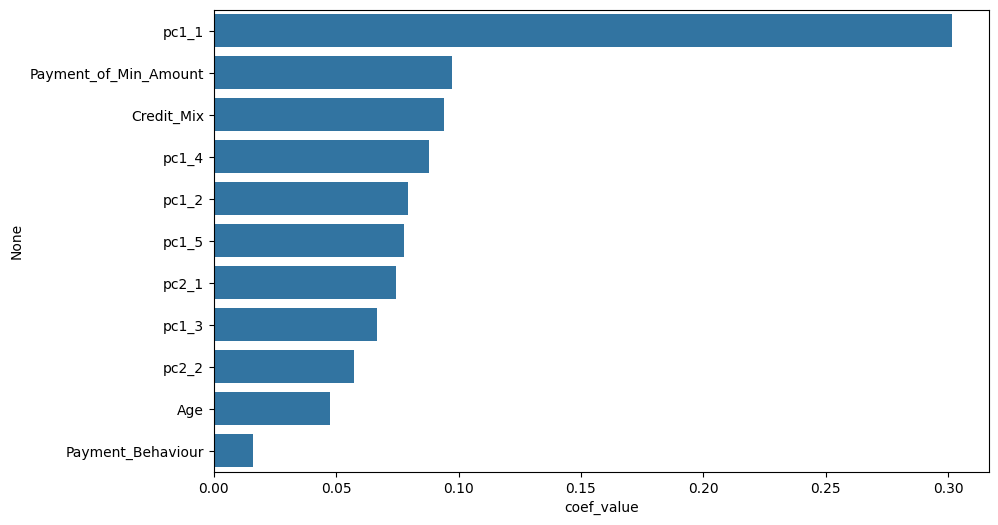

,coef_value
pc1_1,0.301584
Payment_of_Min_Amount,0.097432
Credit_Mix,0.094129
pc1_4,0.087895
pc1_2,0.079226
pc1_5,0.077826
pc2_1,0.074424
pc1_3,0.066646
pc2_2,0.057196
Age,0.047508


In [49]:
def plot_feature_importances(feature_importances, cols):
    feature = pd.DataFrame(feature_importances, columns=['coef_value']).set_index(cols)
    feature = feature.sort_values(by='coef_value', ascending=False)
    top_features = feature

    plt.figure(figsize=(10, 6))
    sns.barplot(x='coef_value', y=top_features.index, data=feature)
    plt.show()
    return top_features

plot_feature_importances(gboost_model.feature_importances_, train_pca_df.columns)

- Nah, berdasarkan visualisasi di atas terlihat bahwa model gboost_model menggunakan feature pc_1_1 sebagai fitur utama dalam menghasilkan sebuah prediksi. Informasi ini tentunya akan sangat membantu Anda dalam meningkatkan performa model.